# Beard Removal Dataset Generation Demo
This notebook demonstrates how to use the StableDiffusionGenerator to create paired images (with and without beard) and generate a full dataset.

In [ ]:
# Clone the project repository if running in Colab (uncomment if needed)
#!git clone https://github.com/ErayOnder/AI-BeardRemoval-Project.git
#%cd AI-BeardRemoval-Project
#%pip install -r requirements.txt

## Configuration

In [1]:
# Python Standard Libraries
import sys
import os
import random
import argparse # For creating argument Namespace
from pathlib import Path

# Third-party Libraries
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader # DataLoader is used in train.py, but good to have if needed directly
import torchvision.transforms as T # For metrics cell if transforming PIL images
from tqdm import tqdm # tqdm is used in train.py

# Check if running in Google Colab
def is_colab():
    try:
        import google.colab
        return True
    except ImportError:
        return False

# Configure environment based on runtime
if is_colab():
    print("Running in Google Colab environment")
    from google.colab import drive
    drive.mount('/content/drive')
    # Set output directory in Google Drive
    output_dir = '/content/drive/MyDrive/beard_dataset'
    pix2pix_checkpoint_dir = '/content/drive/MyDrive/beard_removal_models'
else:
    print("Running in local environment")
    # Set output directory locally
    output_dir = 'dataset'
    pix2pix_checkpoint_dir = 'models'

# --- Project-specific imports ---
# Ensure the project root is in the Python path
# This assumes your notebook is in the 'AI-BeardRemoval-Project' root after %cd
if "." not in sys.path:
    sys.path.append(".")

from utils.stable_diffusion_helper import StableDiffusionGenerator
from training.train import train
from training.plot_metrics import plot_training_metrics, load_metrics_from_checkpoint
from testing.metrics import compute_ssim, compute_psnr
from testing.inference import predict

print("All modules imported successfully.")

# --- Configuration ---
# Create directories
os.makedirs(output_dir, exist_ok=True)
os.makedirs(pix2pix_checkpoint_dir, exist_ok=True)

print(f"Dataset directory: {output_dir}")
print(f"Model checkpoints will be saved in: {pix2pix_checkpoint_dir}")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")

Running in local environment
All modules imported successfully.
Dataset directory: dataset
Model checkpoints will be saved in: models
Using device: mps


## Dataset Generation

In [7]:
# Initialize the Stable Diffusion generator
# This might take some time to download models if run for the first time
print("Initializing StableDiffusionGenerator...")
sd_generator = StableDiffusionGenerator()
print("StableDiffusionGenerator initialized.")

# Generate the dataset
num_dataset_pairs = 100  # Number of image pairs for the dataset
test_set_split = 0.2    # 20% for the test set

print(f"Generating dataset with {num_dataset_pairs} pairs to {output_dir}...")
sd_generator.generate_dataset(
    num_pairs=num_dataset_pairs,
    test_split=test_set_split,
    output_dir=output_dir,
    use_face_detection=True # Set to False if face_recognition causes issues or for faster generation
)
print("Dataset generation complete.")

# Verify dataset structure (optional)
train_beard_count = len(list(Path(output_dir, "train", "beard").glob("*.png")))
train_nobeard_count = len(list(Path(output_dir, "train", "no_beard").glob("*.png")))
test_beard_count = len(list(Path(output_dir, "test", "beard").glob("*.png")))
test_nobeard_count = len(list(Path(output_dir, "test", "no_beard").glob("*.png")))

print(f"Train beard images: {train_beard_count}")
print(f"Train no_beard images: {train_nobeard_count}")
print(f"Test beard images: {test_beard_count}")
print(f"Test no_beard images: {test_nobeard_count}")

if train_beard_count == 0 or test_beard_count == 0:
    print("Warning: Dataset seems empty. Check the generation process and paths.")

INFO:utils.stable_diffusion_helper:Using device: mps


Initializing StableDiffusionGenerator...


Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 16.06it/s]
INFO:utils.stable_diffusion_helper:Successfully loaded Stable Diffusion models
INFO:utils.stable_diffusion_helper:Found 80 existing training pairs and 20 existing test pairs
INFO:utils.stable_diffusion_helper:Dataset generation complete! Total pairs: 100 (Train: 80, Test: 20)


StableDiffusionGenerator initialized.
Generating dataset with 100 pairs to dataset...
Dataset generation complete.
Train beard images: 80
Train no_beard images: 80
Test beard images: 20
Test no_beard images: 20


#### Generate 10 Sample Paired Images

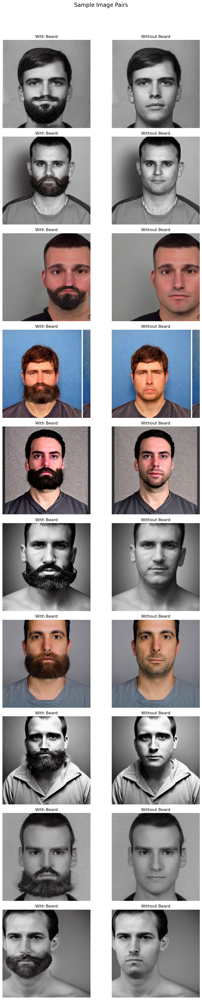

In [9]:
# List all available pairs in train/beard
beard_dir = os.path.join(output_dir, "train", "beard")
no_beard_dir = os.path.join(output_dir, "train", "no_beard")

beard_files = [f for f in os.listdir(beard_dir) if f.endswith('_beard.png')]

# Randomly select 10 pairs
sample_files = random.sample(beard_files, min(10, len(beard_files)))

# Create a figure with subplots for all pairs
num_pairs = len(sample_files)
fig, axes = plt.subplots(num_pairs, 2, figsize=(10, 4*num_pairs))
fig.suptitle('Sample Image Pairs', fontsize=16, y=1.02)

for idx, f in enumerate(sample_files):
    beard_path = os.path.join(beard_dir, f)
    nobeard_path = os.path.join(no_beard_dir, f.replace('_beard.png', '_nobeard.png'))
    
    if os.path.exists(beard_path) and os.path.exists(nobeard_path):
        # Load and display beard image
        beard_img = Image.open(beard_path)
        axes[idx, 0].imshow(beard_img)
        axes[idx, 0].axis('off')
        axes[idx, 0].set_title('With Beard')
        
        # Load and display no-beard image
        nobeard_img = Image.open(nobeard_path)
        axes[idx, 1].imshow(nobeard_img)
        axes[idx, 1].axis('off')
        axes[idx, 1].set_title('Without Beard')

plt.tight_layout()
plt.show()

## Model Training

In [ ]:
# --- Training Configuration for Pix2Pix ---
# Create an Namespace object to hold training arguments
train_args = argparse.Namespace(
    epochs=50, 
    batch_size=1, 
    lr=0.0002,
    lambda_l1=100.0,
    data_dir=output_dir, # Directory where the 'train' and 'test' splits are located
    checkpoint_dir=pix2pix_checkpoint_dir, # Directory to save model checkpoints
    device=device
)

print("Starting Pix2Pix model training...")
print(f"Training arguments: {train_args}")

# Call the train function
# The train.py script handles model initialization, dataloaders, optimizer, and the training loop.
try:
    metrics, generator = train(train_args)
    print("Training finished.")
except Exception as e:
    print(f"An error occurred during training: {e}")
    import traceback
    traceback.print_exc()

# Plot the metrics from the training
plot_training_metrics(metrics)

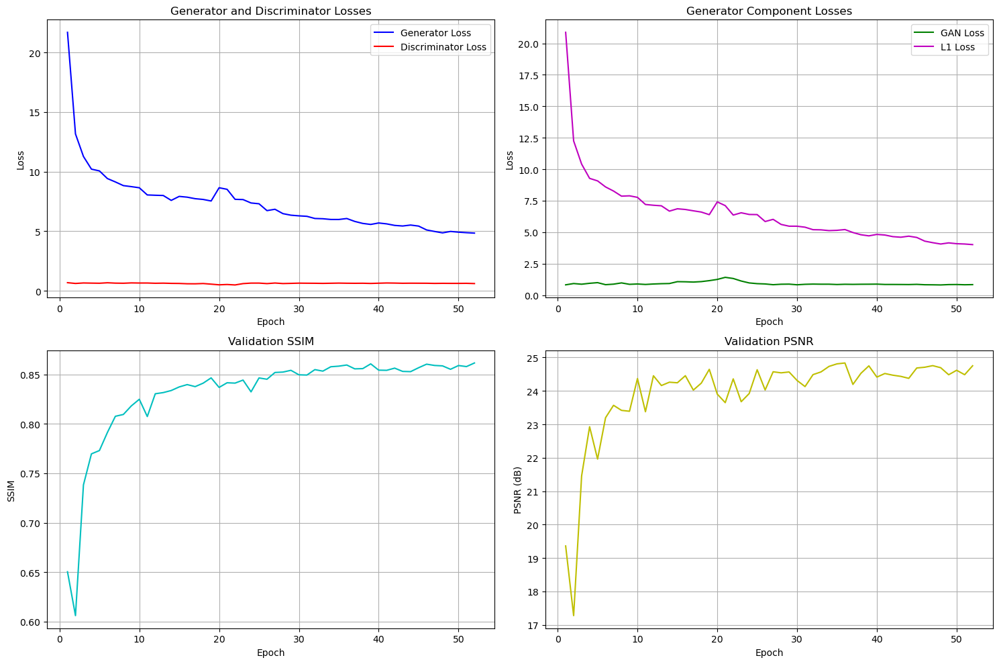

In [10]:
# Load the metrics from the best generator checkpoint
checkpoint_path = Path(pix2pix_checkpoint_dir) / "best_generator.pth"
if checkpoint_path:
    loaded_metrics = load_metrics_from_checkpoint(checkpoint_path, device=device)
    if loaded_metrics:
        plot_training_metrics(loaded_metrics)

# Inference

Running inference with the trained model...
Selected 4 random test images
Using model checkpoint: models/best_generator.pth


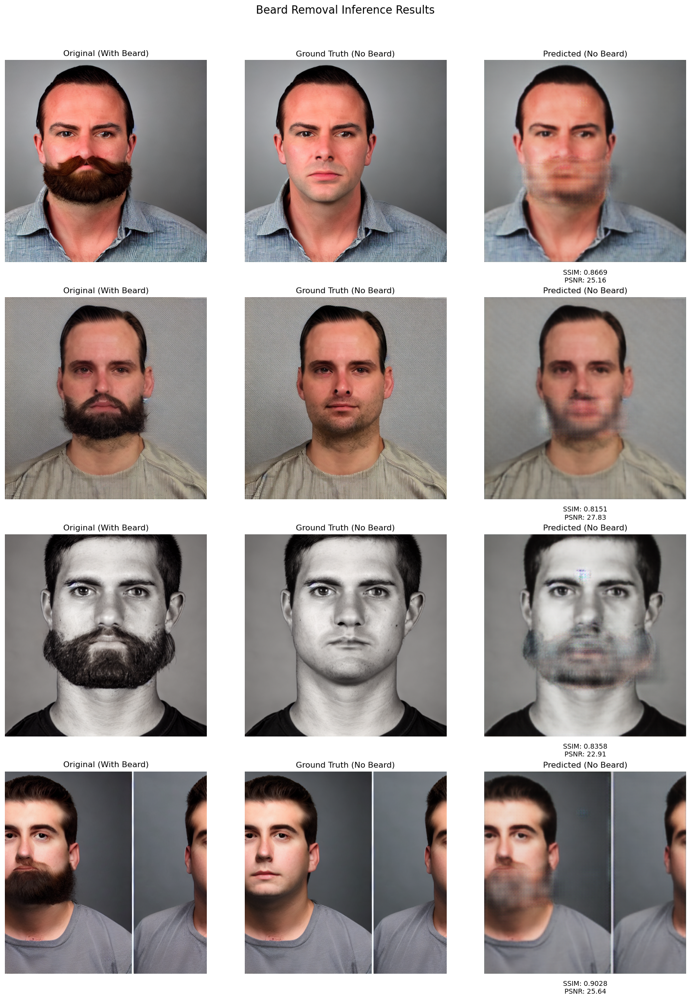


Average metrics across 4 samples:
Average SSIM: 0.8552
Average PSNR: 25.38


In [2]:
print("Running inference with the trained model...")

# --- Inference Configuration ---
num_samples = 4  # Number of sample images to process
# Path to a sample input image from the test set
test_beard_dir = Path(output_dir) / "test" / "beard"
sample_image_files = list(test_beard_dir.glob("*_beard.png"))
if not sample_image_files:
    print(f"No images found in {test_beard_dir}. Cannot run inference.")
else:
    num_samples = min(num_samples, len(sample_image_files))
    sample_image_paths = random.sample(sample_image_files, num_samples)
    print(f"Selected {num_samples} random test images")

# Path to the trained model checkpoint
trained_model_path = Path(pix2pix_checkpoint_dir) / "best_generator.pth"
if not trained_model_path:
    print("No trained model found. Please train the model first.")
print(f"Using model checkpoint: {trained_model_path}")


if sample_image_paths and trained_model_path.exists():
    try:
        fig = plt.figure(figsize=(15, 5 * num_samples))
        fig.suptitle("Beard Removal Inference Results", fontsize=16, y=1.02)

        metrics = []

        for idx, sample_path in enumerate(sample_image_paths):
            # Perform prediction using the predict function from testing.inference
            predicted_pil_image = predict(img_path=sample_path, model_path=trained_model_path, device=device)

            # Display the original and ground truth images
            original_pil_image = Image.open(sample_path).convert("RGB")
            ground_truth_path = str(sample_path).replace("/beard/", "/no_beard/").replace("_beard.png", "_nobeard.png")
            ground_truth_pil_image = Image.open(ground_truth_path).convert("RGB")

            # Create subplot for this sample
            axes = []
            for j in range(3):
                ax = plt.subplot(num_samples, 3, idx * 3 + j + 1)
                axes.append(ax)

            # Display images
            axes[0].imshow(original_pil_image)
            axes[0].set_title("Original (With Beard)")
            axes[0].axis("off")

            axes[1].imshow(ground_truth_pil_image)
            axes[1].set_title("Ground Truth (No Beard)")
            axes[1].axis("off")

            axes[2].imshow(predicted_pil_image)
            axes[2].set_title("Predicted (No Beard)")
            axes[2].axis("off")
            
            # Calculate metrics
            ssim_value = compute_ssim(ground_truth_pil_image, predicted_pil_image)
            psnr_value = compute_psnr(ground_truth_pil_image, predicted_pil_image)
            metrics.append((ssim_value, psnr_value))

            # Add metrics as text under the predicted image
            axes[2].text(0.5, -0.1, f"SSIM: {ssim_value:.4f}\nPSNR: {psnr_value:.2f}",
                         horizontalalignment="center",
                         transform=axes[2].transAxes)
        
        plt.tight_layout()
        plt.show()

        # Print average metrics
        if metrics:
            avg_ssim = sum(m[0] for m in metrics) / len(metrics)
            avg_psnr = sum(m[1] for m in metrics) / len(metrics)
            print(f"\nAverage metrics across {num_samples} samples:")
            print(f"Average SSIM: {avg_ssim:.4f}")
            print(f"Average PSNR: {avg_psnr:.2f}")

    except Exception as e:
        print(f"An error occurred during inference: {e}")
        import traceback
        traceback.print_exc()
else:
    print("Skipping inference due to missing sample image or model checkpoint.")

#### Model Evaluation
- **Approach**: Compare generated clean-shaven image with its paired ground-truth target.
- **Metrics**:
    - *SSIM* – captures structural similarity; closer to 1 = better.
    - *PSNR* – simple pixel-error proxy; higher dB = better.


#### Key Challenges & Fixes
- **Consistent pairs from Stable Diffusion**
    - used StableDiffusionInpaintPipeline fed with beard area mask
    - fixed seed + identical prompt except “beard/clean-shaven”
- **Tiny dataset (≈100 pairs)**
    - resources are limited, tiny U-net
- **GPU restriction**
    - used Google Colab, resized it to 256

#### Future Improvements
- **More & (maybe) real data**
- **Higher-res training**
- **Richer losses**
- **Advanced Models**